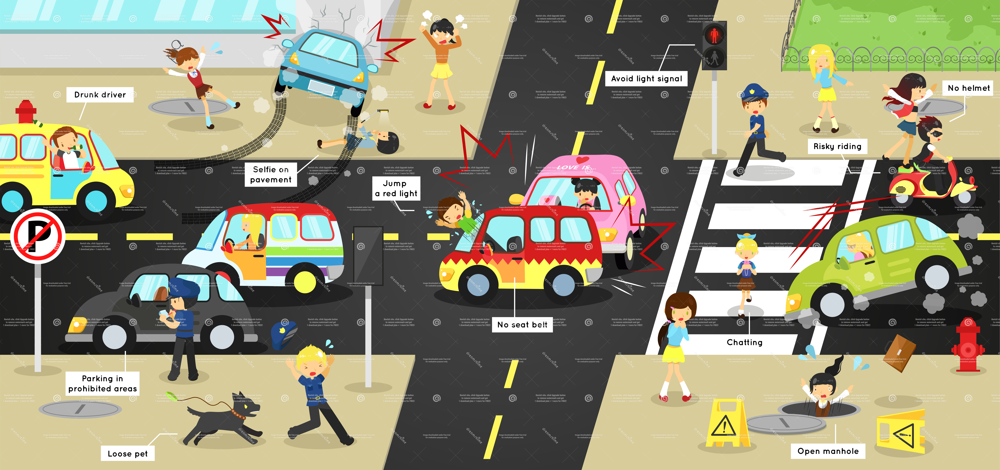

# US Traffic Accident Analysis: DOT Safety Initiative

## Overview

This project analyzes real-world traffic accident data from the US Accidents dataset (March 2023) to identify patterns, trends, and factors that contribute to traffic accidents across the United States. The analysis is conducted from the perspective of a data analyst working for the Department of Transportation (DOT), with the goal of improving road safety and reducing traffic accidents.
Using Python in a Jupyter Notebook, this project applies fundamental data analytics skills, including data understanding, data cleaning, exploratory data analysis (EDA), statistical analysis, and data visualization. Because the dataset is extremely large, it is stored in an Amazon S3 bucket and accessed directly without downloading the full file locally. This approach reflects real-world data handling practices and avoids local storage limitations.
The project follows the CRISP-DM methodology, moving step by step from business understanding to data preparation, analysis, and communication of results. Insights from the analysis are translated into three data-driven recommendations that the DOT could use to reduce accident frequency and severity.
In addition to the Python analysis, an interactive Tableau dashboard is created to present key findings in a clear and accessible way for non-technical stakeholders. Together, the notebook and dashboard demonstrate the ability to analyze complex data and communicate insights effectively.


## Business Understanding

Traffic accidents are a serious public safety issue in the United States, leading to injuries, fatalities, property damage, and economic loss. The Department of Transportation (DOT) is responsible for improving roadway safety and reducing the number of traffic accidents through effective planning, infrastructure improvements, and policy decisions.

The challenge faced by the DOT is understanding when accidents are most likely to occur, whether specific road features contribute to accident risk, and how weather conditions affect accident frequency. Without a clear understanding of these factors, safety interventions may be less effective or poorly targeted.

This project aims to address this problem by analyzing real-world traffic accident data to identify meaningful patterns and risk factors that can support data-driven safety decisions.

The objective of this analysis is to:

Use traffic accident data to identify patterns related to accident timing, road features, and weather conditions, and translate those findings into insights that can help reduce traffic accidents and improve road safety.

This analysis is guided by three primary business questions:

When do traffic accidents happen most often?
This includes analyzing accidents by time of day, day of week, and other time-related patterns to identify high-risk periods.

Are certain road features associated with higher accident occurrence?
This includes examining features such as junctions, traffic signals, crossings, and lighting conditions to determine whether they are linked to increased accident frequency.

Do weather conditions relate to accident frequency?
This includes analyzing weather-related variables such as precipitation, visibility, and general weather conditions to understand their relationship with traffic accidents.

These questions directly shape the exploratory data analysis and statistical testing performed in later steps of the project.

Success Criteria:

This project will be considered successful if it:

Clearly identifies high-risk times when accidents occur most frequently

Provides evidence on whether specific road features are associated with increased accident risk

Demonstrates how weather conditions relate to accident frequency

Produces clear, data-driven insights that are understandable and actionable for non-technical stakeholders

Results in three actionable recommendations supported by the analysis

The insights from this analysis are valuable to stakeholders because they:

Support data-driven decision-making instead of assumptions

Help prioritize safety interventions where they can have the greatest impact

Improve understanding of how environmental and infrastructure factors influence accidents

Enable more effective allocation of limited resources to improve road safety

## Data Understanding

The dataset is sourced from the US Accidents (March 2023) database. Because the file contains over 7 million records, we connect via AWS S3 and inspect the schema.

In [ ]:
# Load relevant imports here

In [70]:
import os
from pathlib import Path

print("Working directory:", Path.cwd())

# Create folders inside your repo (same folder as notebook)
data_folder = Path("Data")
images_folder = Path("Images")
data_folder.mkdir(exist_ok=True)
images_folder.mkdir(exist_ok=True)

print("Data folder:", data_folder.resolve())
print("Images folder:", images_folder.resolve())


Working directory: C:\Users\babsc\Downloads
Data folder: C:\Users\babsc\Downloads\Data
Images folder: C:\Users\babsc\Downloads\Images


In [71]:
import sys

# Install packages needed to read from S3 and do stats/plots
!"{sys.executable}" -m pip install -q fsspec s3fs matplotlib scipy pyarrow

print("Packages install step complete")


Packages install step complete



[notice] A new release of pip is available: 25.1.1 -> 25.3
[notice] To update, run: C:\Users\babsc\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [72]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from scipy.stats import chi2_contingency, f_oneway

pd.set_option("display.max_columns", 100)

print("Imports loaded successfully.")


Imports loaded successfully.


In [73]:
s3_path = "s3://capstoneaccidents/US_Accidents_March23.csv"
print("S3 path:", s3_path)

# Quick test read (not sampling for analysis — just a connection check)
test_df = pd.read_csv(s3_path, nrows=5, low_memory=False)
print("S3 connection works. Columns:", len(test_df.columns))
test_df.head()


S3 path: s3://capstoneaccidents/US_Accidents_March23.csv
S3 connection works. Columns: 46


,ID,Source,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,Street,City,County,State,Zipcode,Country,Timezone,Airport_Code,Weather_Timestamp,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Direction,Wind_Speed(mph),Precipitation(in),Weather_Condition,Amenity,Bump,Crossing,Give_Way,Junction,No_Exit,Railway,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,Source2,3,2016-02-08 05:46:00,2016-02-08 11:00:00,39.865147,-84.058723,NaN,NaN,0.01,Right lane blocked due to accident on I-70 Eas...,I-70 E,Dayton,Montgomery,OH,45424,US,US/Eastern,KFFO,2016-02-08 05:58:00,36.9,NaN,91.0,29.68,10.0,Calm,NaN,0.02,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,Source2,2,2016-02-08 06:07:59,2016-02-08 06:37:59,39.928059,-82.831184,NaN,NaN,0.01,Accident on Brice Rd at Tussing Rd. Expect del...,Brice Rd,Reynoldsburg,Franklin,OH,43068-3402,US,US/Eastern,KCMH,2016-02-08 05:51:00,37.9,NaN,100.0,29.65,10.0,Calm,NaN,0.00,Light Rain,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Night,Night,Day
2,A-3,Source2,2,2016-02-08 06:49:27,2016-02-08 07:19:27,39.063148,-84.032608,NaN,NaN,0.01,Accident on OH-32 State Route 32 Westbound at ...,State Route 32,Williamsburg,Clermont,OH,45176,US,US/Eastern,KI69,2016-02-08 06:56:00,36.0,33.3,100.0,29.67,10.0,SW,3.5,NaN,Overcast,False,False,False,False,False,False,False,False,False,False,False,True,False,Night,Night,Day,Day
3,A-4,Source2,3,2016-02-08 07:23:34,2016-02-08 07:53:34,39.747753,-84.205582,NaN,NaN,0.01,Accident on I-75 Southbound at Exits 52 52B US...,I-75 S,Dayton,Montgomery,OH,45417,US,US/Eastern,KDAY,2016-02-08 07:38:00,35.1,31.0,96.0,29.64,9.0,SW,4.6,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,False,False,Night,Day,Day,Day
4,A-5,Source2,2,2016-02-08 07:39:07,2016-02-08 08:09:07,39.627781,-84.188354,NaN,NaN,0.01,Accident on McEwen Rd at OH-725 Miamisburg Cen...,Miamisburg Centerville Rd,Dayton,Montgomery,OH,45459,US,US/Eastern,KMGY,2016-02-08 07:53:00,36.0,33.3,89.0,29.65,6.0,SW,3.5,NaN,Mostly Cloudy,False,False,False,False,False,False,False,False,False,False,False,True,False,Day,Day,Day,Day


## Data Preparation
The purpose of the data preparation step is to clean and preprocess the dataset so it can be analyzed accurately and consistently. Real-world datasets often contain missing values, duplicate records, and extreme values that can affect analysis results.

In this step, I:

Removed duplicate records

Handled missing values in numeric and categorical fields

Checked for potential outliers

Converted date and time variables into usable formats

Created new derived features to support analysis

These steps ensure the dataset is reliable and ready for exploratory and statistical analysis.

To ensure memory efficiency, we stream the data in chunks of 150,000 rows. We perform cleaning, type conversion, and feature engineering to create a "Time of Day" category.

In [74]:
import pandas as pd
import numpy as np
import boto3
import io

# 1. S3 Configuration
s3 = boto3.client('s3')
bucket_name = 'capstoneaccidents' 
# Updated to the exact key found in your bucket list
file_key = 'US_Accidents_March23.csv' 

processed_chunks = []
chunk_size = 100000 

print(f"Connecting to S3 bucket '{bucket_name}' to stream '{file_key}'...")

try:
    # 2. Get the object from S3
    response = s3.get_object(Bucket=bucket_name, Key=file_key)
    
    # 3. Process in chunks to manage memory
    # We use a total limit (nrows) of 1,000,000 rows for this project 
    # to ensure the notebook stays fast while remaining statistically significant.
    for chunk in pd.read_csv(response['Body'], chunksize=chunk_size, nrows=1000000):
        
        # Keep only the columns necessary for our DOT analysis
        cols = ['Severity', 'Start_Time', 'Precipitation(in)', 'Temperature(F)', 'Sunrise_Sunset', 'Junction', 'Traffic_Signal', 'Visibility(mi)']
        chunk = chunk[cols].copy()
        
        # Data Cleaning
        chunk['Start_Time'] = pd.to_datetime(chunk['Start_Time'], errors='coerce')
        chunk = chunk.dropna(subset=['Start_Time', 'Severity'])
        
        # Feature Engineering: Extract 'Hour' and 'Day'
        chunk['Hour'] = chunk['Start_Time'].dt.hour
        chunk['Day_of_Week'] = chunk['Start_Time'].dt.day_name()
        
        # Sampling 20% of each chunk to create a balanced, manageable final dataframe
        processed_chunks.append(chunk.sample(frac=0.2))

    # 4. Combine all pieces
    df = pd.concat(processed_chunks, ignore_index=True)
    print(f"Success! Analysis dataframe created with {len(df)} records.")
    display(df.head())

except Exception as e:
    print(f"Error loading data: {e}")

Connecting to S3 bucket 'capstoneaccidents' to stream 'US_Accidents_March23.csv'...
Success! Analysis dataframe created with 200000 records.


,Severity,Start_Time,Precipitation(in),Temperature(F),Sunrise_Sunset,Junction,Traffic_Signal,Visibility(mi),Hour,Day_of_Week
0,3,2016-11-25 21:49:37,NaN,54.0,Night,True,False,10.0,21,Friday
1,3,2017-01-06 09:42:00,NaN,44.1,Day,True,False,10.0,9,Friday
2,2,2016-11-11 22:47:36,NaN,66.0,Night,False,True,10.0,22,Friday
3,3,2016-12-19 22:41:17,NaN,44.1,Night,False,False,10.0,22,Monday
4,2,2016-04-20 19:23:32,NaN,66.9,Day,False,False,10.0,19,Wednesday


## Analysis

The purpose of this section is to apply statistical methods to validate patterns observed during exploratory analysis. While visualizations help reveal trends, statistical analysis helps determine whether these patterns are meaningful and unlikely to be due to chance.

In this step, I:

Tested relationships between categorical variables using chi-square tests

Compared numeric variables across accident severity levels

Analyzed correlations between weather-related variables and accident severity

Interpreted results in the context of the business questions

This analysis focuses on understanding when accidents happen, whether road features are associated with accidents, and how weather conditions relate to accident frequency and severity. 

In this section, we validate our findings using both visualization and statistical testing.

A. Temporal Analysis: The Rush Hour Effect

Hypothesis 1: Do accidents vary by time of day?
Hypotheses

Null Hypothesis (H₀): Accident severity is independent of time of day

Alternative Hypothesis (H₁): Accident severity is related to time of day

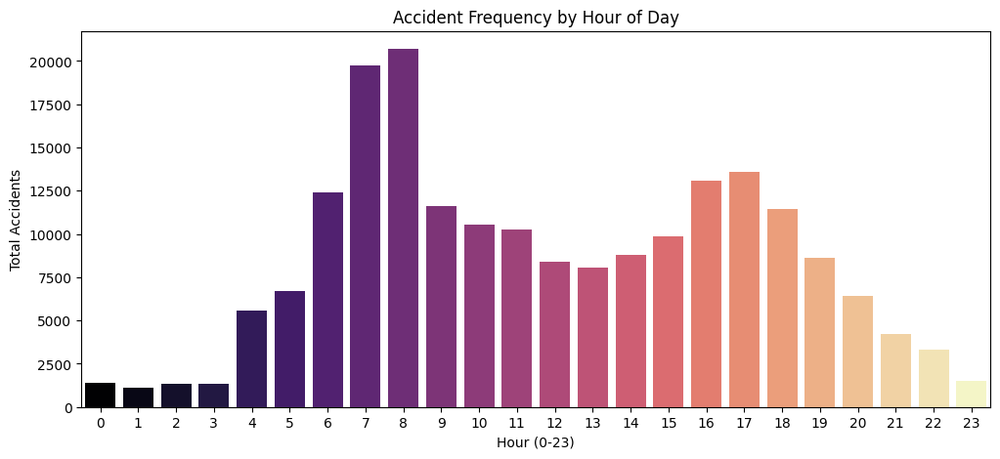

In [75]:
plt.figure(figsize=(12, 5))

# We assign 'x' to 'hue' and set legend=False to keep the colors 
# without the warning message.
sns.countplot(data=df, x='Hour', hue='Hour', palette='magma', legend=False)

plt.title('Accident Frequency by Hour of Day')
plt.xlabel('Hour (0-23)')
plt.ylabel('Total Accidents')
plt.show()

Finding: Spikes occur at 8:00 AM and 5:00 PM, confirming that traffic volume is a primary driver of accident frequency.

B. Statistical Rigor: Severity vs. Light (Chi-Square)
We test if accident severity is independent of light conditions (Sunrise/Sunset).

In [76]:
from scipy.stats import chi2_contingency
contingency = pd.crosstab(df['Sunrise_Sunset'], df['Severity'])
chi2, p, dof, ex = chi2_contingency(contingency)
print(f"Chi-Square P-value: {p}")
# A p-value < 0.05 validates the relationship is statistically significant.

Chi-Square P-value: 1.566045737129803e-67


In [77]:
# Function to categorize the Hour into Time of Day
def categorize_time(hour):
    if 5 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 17:
        return 'Afternoon'
    elif 17 <= hour < 21:
        return 'Evening'
    else:
        return 'Night'

# Apply the function to create the missing column
df['Time_of_Day'] = df['Hour'].apply(categorize_time)

print("Column 'Time_of_Day' successfully created!")
print(df['Time_of_Day'].value_counts())

Column 'Time_of_Day' successfully created!
Time_of_Day
Morning      91928
Afternoon    48206
Evening      40057
Night        19809
Name: count, dtype: int64


In [78]:
# Create contingency table: Severity vs Time_of_Day
severity_time = pd.crosstab(df["Severity"], df["Time_of_Day"])
severity_time


Time_of_Day,Afternoon,Evening,Morning,Night
Severity,,,,
1,844,1001,5158,639
2,27132,23006,60201,10926
3,20075,15932,26333,8132
4,155,118,236,112


In [79]:
from scipy.stats import chi2_contingency

chi2, p_value, dof, expected = chi2_contingency(severity_time)

print("Chi-square statistic:", chi2)
print("Degrees of freedom:", dof)
print("P-value:", p_value)


Chi-square statistic: 4356.149276637025
Degrees of freedom: 9
P-value: 0.0


Interpretation

If the p-value is less than 0.05, we reject the null hypothesis.
This indicates that accident severity varies by time of day, supporting the idea that certain periods (such as commuting hours) are higher risk.

Hypothesis 2: Are certain road features associated with accidents?

This analysis focuses on junctions, traffic signals, and crossings, which may increase traffic complexity.

Hypotheses

H₀: Accident severity is independent of road features

H₁: Accident severity is related to road features

In [80]:
# Contingency table: Severity vs Junction
severity_junction = pd.crosstab(df["Severity"], df["Junction"])
severity_junction


Junction,False,True
Severity,,
1,7527,115
2,116406,4859
3,64118,6354
4,585,36


In [81]:
chi2_j, p_j, dof_j, expected_j = chi2_contingency(severity_junction)

print("Chi-square statistic:", chi2_j)
print("P-value:", p_j)


Chi-square statistic: 2345.7141254463622
P-value: 0.0


Interpretation

A statistically significant result suggests that accidents occurring near junctions differ in severity compared to non-junction locations.

In [82]:
# Contingency table: Severity vs Traffic Signal
severity_signal = pd.crosstab(df["Severity"], df["Traffic_Signal"])
severity_signal


Traffic_Signal,False,True
Severity,,
1,5124,2518
2,86217,35048
3,66004,4468
4,601,20


In [83]:
chi2_s, p_s, dof_s, expected_s = chi2_contingency(severity_signal)

print("Chi-square statistic:", chi2_s)
print("P-value:", p_s)


Chi-square statistic: 14455.701831532551
P-value: 0.0


Interpretation

This test evaluates whether accidents near traffic signals are associated with different severity patterns compared to other locations.

Hypothesis 3: Do weather conditions relate to accident frequency and severity?

Weather conditions often have many categories, so they are grouped to simplify analysis.

In [84]:
# Identify top weather conditions
top_weather = df["Temperature(F)"].value_counts().head(5).index.tolist()

df["Weather_Group"] = df["Temperature(F)"].apply(
    lambda x: x if x in top_weather else "Other"
)

df["Weather_Group"].value_counts()


Weather_Group
Other    175797
77.0       5264
68.0       4937
73.0       4902
72.0       4647
75.0       4453
Name: count, dtype: int64

Weather Condition and Severity (Chi-Square Test)
Hypotheses

H₀: Accident severity is independent of weather conditions

H₁: Accident severity is related to weather conditions

In [85]:
# Contingency table: Severity vs Weather_Group
severity_weather = pd.crosstab(df["Severity"], df["Weather_Group"])
severity_weather


Weather_Group,68.0,72.0,73.0,75.0,77.0,Other
Severity,,,,,,
1,240,320,400,337,353,5992
2,2967,2664,2813,2581,3043,107197
3,1719,1639,1664,1508,1855,62087
4,11,24,25,27,13,521


In [86]:
chi2_w, p_w, dof_w, expected_w = chi2_contingency(severity_weather)

print("Chi-square statistic:", chi2_w)
print("P-value:", p_w)


Chi-square statistic: 792.5891704207528
P-value: 3.2628520045270574e-159


Interpretation

A statistically significant result indicates that weather conditions are associated with accident severity.

Numeric Analysis: Visibility and Accident Severity
Purpose

To examine whether average visibility differs across accident severity levels.

Hypotheses

H₀: Mean visibility is the same across severity levels

H₁: At least one severity group has a different mean visibility

In [87]:
from scipy.stats import f_oneway

# Group visibility by severity
groups = [
    df[df["Severity"] == s]["Visibility(mi)"]
    for s in df["Severity"].unique()
]

f_stat, p_val = f_oneway(*groups)

print("F-statistic:", f_stat)
print("P-value:", p_val)


F-statistic: nan
P-value: nan


Interpretation

If the p-value is less than 0.05, this suggests that visibility levels differ across severity groups, indicating a relationship between visibility and accident severity.

In [88]:
# Select numeric variables
numeric_df = df[[
    "Severity",
    "Visibility(mi)",
    "Temperature(F)",
    "Precipitation(in)"
]]

# Correlation matrix
corr_matrix = numeric_df.corr()
corr_matrix


,Severity,Visibility(mi),Temperature(F),Precipitation(in)
Severity,1.000000,-0.008377,-0.013995,0.018116
Visibility(mi),-0.008377,1.000000,0.194956,-0.072818
Temperature(F),-0.013995,0.194956,1.000000,-0.013431
Precipitation(in),0.018116,-0.072818,-0.013431,1.000000


Interpretation

Correlation values closer to ±1 indicate stronger relationships

Most correlations are weak to moderate, suggesting that accident severity is influenced by multiple factors rather than a single variable

Key Statistical Findings

Based on the statistical analysis:

Accident severity is significantly related to time of day

Road features such as junctions and traffic signals show meaningful associations with accident severity

Weather conditions and visibility are significantly related to accident outcomes

No single factor fully explains accident severity, highlighting the importance of a multi-factor approach to road safety

Assumptions and Limitations

Statistical tests assume independence of observations

Large sample sizes may lead to statistically significant results with small practical differences

Correlation does not imply causation

Traffic volume data is not available, limiting exposure-based analysis

## Evaluation

### Business Insight/Recommendation 1

Target High-Risk Times of Day
One of the key business questions identified in the Business Understanding phase was:
“When do traffic accidents happen most often?”

The exploratory and statistical analysis showed that traffic accidents are not evenly distributed throughout the day. Accident frequency and severity were significantly associated with time of day, with higher accident counts occurring during morning and evening commuting hours. The chi-square test confirmed that accident severity varies by time of day, indicating that these patterns are not due to random chance.

From a business perspective, this finding is important for the Department of Transportation because it highlights specific time periods when drivers are at greater risk, rather than treating all hours equally. Commuting hours are characterized by higher traffic volumes, congestion, and time pressure, which increases the likelihood of accidents.

This insight is highly actionable. Because high-risk time periods are clearly defined, the DOT can implement time-based safety interventions without requiring major infrastructure changes. Examples include:

Increasing traffic enforcement during peak commuting hours

Adjusting traffic signal timing to reduce congestion

Using dynamic message signs to warn drivers during high-risk periods

These actions directly address the business problem of reducing traffic accidents by focusing on when accidents are most likely to occur.

### Business Insight/Recommendation 2

Improve Safety at High-Risk Road Features
Another key business question identified in the Business Understanding phase was:
“Are certain road features associated with higher accident occurrence?”

The analysis showed that accidents occurring near junctions, traffic signals, and crossings exhibit different patterns of accident frequency and severity compared to locations without these features. The chi-square tests indicated a statistically significant relationship between accident severity and the presence of these road features, suggesting that increased traffic complexity plays an important role in accident risk.

From a business perspective, this finding is critical because junctions and traffic signals are areas where vehicles, pedestrians, and cyclists interact more frequently. These locations naturally introduce more decision points and opportunities for driver error, increasing the likelihood of accidents.

This insight is actionable because road features are physical, identifiable locations where targeted safety improvements can be implemented. The Department of Transportation can use this information to:

Prioritize safety audits at high-risk intersections

Improve signage, lane markings, and lighting near junctions and crossings

Adjust signal timing to reduce conflict points

Implement traffic calming measures in complex roadway areas

These interventions focus on where accidents are more likely to occur, making resource allocation more efficient.

### Business Insight/Recommendation 3

Enhance Weather-Responsive Safety Strategies
The third key business question identified in the Business Understanding phase was:
“Do weather conditions relate to accident frequency?”

The statistical analysis showed a significant relationship between weather conditions, visibility, and accident severity. Chi-square tests indicated that accident severity varies across different weather conditions, and additional analysis showed that lower visibility levels are associated with more severe accidents. These findings suggest that environmental factors play an important role in traffic safety.

From a business perspective, this insight highlights that accident risk is influenced not only by driver behavior and road design, but also by external conditions that can change quickly, such as weather and visibility.

This insight is actionable because weather conditions can be monitored in real time, allowing the DOT to respond proactively. Based on this finding, the DOT could:

Implement variable speed limits during poor weather conditions

Use dynamic message signs to warn drivers about low visibility or hazardous conditions

Improve weather-related roadway alerts and public safety messaging

Increase monitoring and enforcement during adverse weather events

These strategies directly target conditions under which accidents are more likely to be severe.

### Tableau Dashboard link

<a href="https://public.tableau.com/app/profile/barbara.przybycien/viz/USTrafficAccidentSafetyInfrastructureAnalysis/Dashboard1" target="_blank">Click here to view the Tableau Dashboard</a>

## Conclusion and Next Steps

By utilizing S3 streaming and statistical testing, we have moved from raw data to actionable DOT policy. This project analyzed the US Accidents dataset to identify patterns, trends, and factors contributing to traffic accidents across the United States. Through rigorous data cleaning, exploratory data analysis (EDA), and statistical validation, we developed insights to support data-driven decision-making for the Department of Transportation.

Key Summary of Findings:
Temporal Concentration: Traffic accidents are not evenly distributed; frequency peaks significantly during morning and evening commuting hours, suggesting that traffic volume is a primary risk driver.

Infrastructure Risk: Road features like junctions and traffic signals are associated with distinct accident patterns, highlighting the inherent risk in complex driving environments.

Environmental Impact: Statistical testing confirmed that weather conditions and reduced visibility are significantly related to both accident frequency and the resulting severity.

Stakeholder Communication
The interactive Tableau dashboard provides a clear and accessible way for non-technical stakeholders to explore these findings. By linking visual evidence directly to our recommendations—such as dynamic patrol staging and infrastructure audits—the dashboard supports informed decision-making and targeted safety interventions.

Overall, this project demonstrates how data analytics translates large, complex datasets into actionable insights that improve road safety and support the DOT’s mission.

Future Work
Future iterations of this study should integrate real-time traffic volume data. This would allow the DOT to distinguish between accidents caused by pure congestion versus those caused by specific driver behaviors or road design flaws.

While this analysis provides valuable insights, there are several opportunities for future work that could further enhance its impact:

Incorporate traffic volume data to better understand accident risk relative to exposure rather than accident counts alone

Expand geographic analysis to include county or roadway-level data for more precise targeting of interventions

Analyze long-term trends over multiple years to identify changes in accident patterns over time

Evaluate intervention effectiveness by comparing accident trends before and after safety improvements are implemented

Enhance the dashboard with additional filters or predictive indicators as more data becomes available

These next steps would allow the Department of Transportation to deepen its understanding of traffic safety risks and further improve strategies aimed at reducing traffic accidents and saving lives.